#### Inspired by: https://github.com/t3rodrig/LammpsTutorials/blob/master/liquid-vapor/in.spce.txt

At each interface of liquid and vacuum:

$$\gamma=\int_{-\infty}^{\infty}dz(P_{\perp} - P_{//})$$

$$P_{\perp}=P_{zz},\ P_{//}=\frac{1}{2}(P_{xx}+P_{yy})$$

Since there are two interfaces in the simulation:

$$\gamma=\frac{1}{2} \int_{-\infty}^{\infty} dz\Big[P_{zz}-\frac{1}{2}(P_{xx}+P_{yy})\Big]$$

In [1]:
from polymaps.util import open_lmp_data
_ = open_lmp_data("single_water.data", box=True, unwrap=True)

In [2]:
lmp_input_str = """ # https://github.com/t3rodrig/LammpsTutorials/blob/master/liquid-vapor/in.spce.txt
variable       Text equal 300.0        # reference temperature, in K
variable       Ndump equal 1000
variable       Ndump2 equal 100

units          real
boundary       p p p
atom_style     full

read_data      "single_water.data"
include        "tip4p2005.ff"

replicate      6 6 6
fix            fxshake all shake 0.001 20 0 b 1 a 1

variable       xc equal       0.5*(xlo+xhi)
variable       yc equal       0.5*(ylo+yhi)
variable       zc equal       0.5*(zlo+zhi)
variable       xLo equal      -0.5*lx
variable       xHi equal      0.5*lx
variable       yLo equal      -0.5*ly
variable       yHi equal      0.5*ly
variable       zLo equal      -2*lz
variable       zHi equal      2*lz

displace_atoms all move -${xc} -${yc} -${zc} units box
change_box     all x final ${xLo} ${xHi} units box
change_box     all y final ${yLo} ${yHi} units box
change_box     all z final ${zLo} ${zHi} units box

comm_style     tiled
fix            fxbalance all balance 100 1.1 rcb
reset_timestep 0
write_data     data.long_box.interfaces nocoeff

thermo         ${Ndump}
thermo_style   custom step dt cpu time temp press density pe ke xlo xhi ylo yhi zlo zhi atoms
thermo_modify  flush yes
run            0
"""

with open('in.water.prep', 'w') as lmp_script_file:
    lmp_script_file.write(lmp_input_str)

!export OMP_NUM_THREADS=1 && ulimit -s unlimited && mpirun -np 16 /home/xyan11/software/lmp20220623up4/build-cuda/lmp -in in.water.prep

LAMMPS (23 Jun 2022 - Update 4)
  using 1 OpenMP thread(s) per MPI task
Reading data file ...
  orthogonal box = (2 6.8 1) to (5.1 9.9 4.1)
  2 by 2 by 4 MPI processor grid
  reading atoms ...
  3 atoms
  scanning bonds ...
  2 = max bonds/atom
  scanning angles ...
  1 = max angles/atom
  reading bonds ...
  2 bonds
  reading angles ...
  1 angles
Finding 1-2 1-3 1-4 neighbors ...
  special bond factors lj:    0        0        0       
  special bond factors coul:  0        0        0       
     2 = max # of 1-2 neighbors
     1 = max # of 1-3 neighbors
     1 = max # of 1-4 neighbors
     2 = max # of special neighbors
  special bonds CPU = 0.000 seconds
  read_data CPU = 0.007 seconds
Replicating atoms ...
  orthogonal box = (2 6.8 1) to (20.6 25.4 19.6)
  4 by 2 by 2 MPI processor grid
  648 atoms
  432 bonds
  216 angles
Finding 1-2 1-3 1-4 neighbors ...
  special bond factors lj:    0        0        0       
  special bond factors coul:  0        0        0       
     2 = max

In [3]:
_ = open_lmp_data("data.long_box.interfaces", box=True, unwrap=True)

In [4]:
lmp_input_str = """ # https://github.com/t3rodrig/LammpsTutorials/blob/master/liquid-vapor/in.spce.txt
variable       Nsteps equal 500000    # 2 * 5e5 = 1e6 fs (1 ns). total number of steps in the simulation
variable       Nevery equal 100    # use input values every this many timesteps
variable       Nfreq equal ${Nsteps}/100    # calculate averages every this many timesteps
variable       Nrepeat equal 0.5*v_Nfreq/${Nevery}    # calculate averages every this many timesteps
variable       Text equal 300.0        # reference temperature, in K

processors     2 2 *
units          real
atom_style     full
boundary       p p p 

read_data      "data.long_box.interfaces"
include        "tip4p2005.ff"

reset_timestep 0

fix            fxshake all shake 0.001 20 0 b 1 a 1

timestep       0.5
fix            fxnvt all nvt temp ${Text} ${Text} $(150.0*dt)

thermo         1000
thermo_style   custom step dt cpu time temp press density pe ke
thermo_modify  flush yes
neigh_modify   every 1 delay 0 check yes

variable       xPress equal c_thermo_press[1] 
variable       yPress equal c_thermo_press[2] 
variable       zPress equal c_thermo_press[3]
variable       A_in_m equal 1e-10 # Angstrom in meter
variable       atm_in_Pa equal 101325 # note: 1 Pa = 1 N/m^2
variable       N_in_mN equal 1e3 # Newton in milliNewton
variable       convFac equal ${A_in_m}*${atm_in_Pa}*${N_in_mN}
variable       st equal 0.5*lz*(v_zPress-0.5*(v_xPress+v_yPress))*${convFac} # in mN/m
fix            st all ave/time 50 1 50 v_st file "out.surfTension.txt"
fix            strunning all ave/time 1 10 50 v_st ave running file "out.surfTension.running.txt"

variable       Dz equal 0.5 # Angstrom
compute        CC1 all chunk/atom bin/1d z center ${Dz} units box
fix            massDens all ave/chunk ${Nevery} ${Nrepeat} ${Nfreq} CC1 density/mass file "out.massDens.zProfile.txt"

# Computes the symmetric per-atom stress tensor
compute        CC2 all chunk/atom bin/1d z center ${Dz} units box
compute        stpa all stress/atom NULL
fix            stress all ave/chunk ${Nevery} ${Nrepeat} ${Nfreq} CC2 c_stpa[1] c_stpa[2] c_stpa[3] c_stpa[4] c_stpa[5] c_stpa[6] file "out.stress.zProfile.txt"

run            ${Nsteps}
write_data     "final.liquid-vapor.data" nocoeff
"""

with open('in.water.st', 'w') as lmp_script_file:
    lmp_script_file.write(lmp_input_str)

!export OMP_NUM_THREADS=1 && ulimit -s unlimited && mpirun -np 16 /home/xyan11/software/lmp20220623up4/build-cuda/lmp -in in.water.st

LAMMPS (23 Jun 2022 - Update 4)
  using 1 OpenMP thread(s) per MPI task
Reading data file ...
  orthogonal box = (-9.3 -9.3 -37.2) to (9.3 9.3 37.2)
  2 by 2 by 4 MPI processor grid
  reading atoms ...
  648 atoms
  reading velocities ...
  648 velocities
  scanning bonds ...
  2 = max bonds/atom
  scanning angles ...
  1 = max angles/atom
  reading bonds ...
  432 bonds
  reading angles ...
  216 angles
Finding 1-2 1-3 1-4 neighbors ...
  special bond factors lj:    0        0        0       
  special bond factors coul:  0        0        0       
     2 = max # of 1-2 neighbors
     1 = max # of 1-3 neighbors
     1 = max # of 1-4 neighbors
     2 = max # of special neighbors
  special bonds CPU = 0.001 seconds
  read_data CPU = 0.012 seconds
Finding SHAKE clusters ...
       0 = # of size 2 clusters
       0 = # of size 3 clusters
       0 = # of size 4 clusters
     216 = # of frozen angles
  find clusters CPU = 0.000 seconds
PPPM initialization ...
  extracting TIP4P info from pa

In [5]:
_ = open_lmp_data("final.liquid-vapor.data", box=True, unwrap=False)

In [6]:
!ls -lrt out.*

-rwxrwxrwx 1 xyan11 xyan11 149871 Aug 23 20:02 out.surfTension.txt
-rwxrwxrwx 1 xyan11 xyan11 146732 Aug 23 20:02 out.surfTension.running.txt
-rwxrwxrwx 1 xyan11 xyan11 285995 Aug 23 20:02 out.massDens.zProfile.txt
-rwxrwxrwx 1 xyan11 xyan11 586559 Aug 23 20:02 out.stress.zProfile.txt


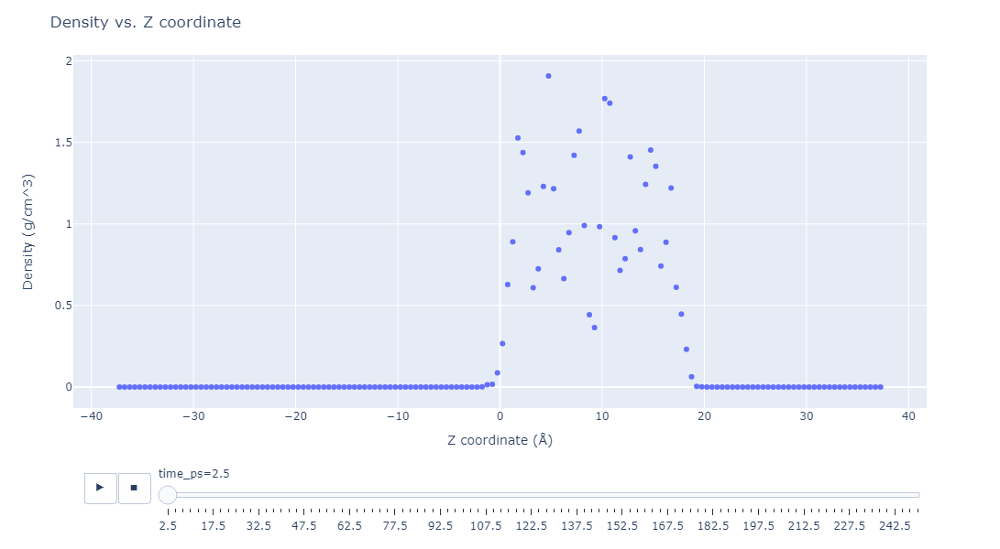

In [7]:
import pandas as pd
import numpy as np
from polymaps.util import read_lmp_fix_file

stepsize = 0.5 / 1000
args = read_lmp_fix_file("out.massDens.zProfile.txt")
df = pd.concat(args["dfs"], axis=0)
df["timestep"] = np.repeat(np.array(args["Timestep"]), args["Number-of-chunks"])
df["time_ps"] = df["timestep"] * stepsize

import plotly.express as px
fig = px.scatter(df, x="Coord1", y="density/mass", animation_frame="time_ps", height=600)
fig.update_xaxes(title="Z coordinate (Å)")
fig.update_yaxes(title="Density (g/cm^3)") 
fig.update_layout(title="Density vs. Z coordinate")

fig.show()

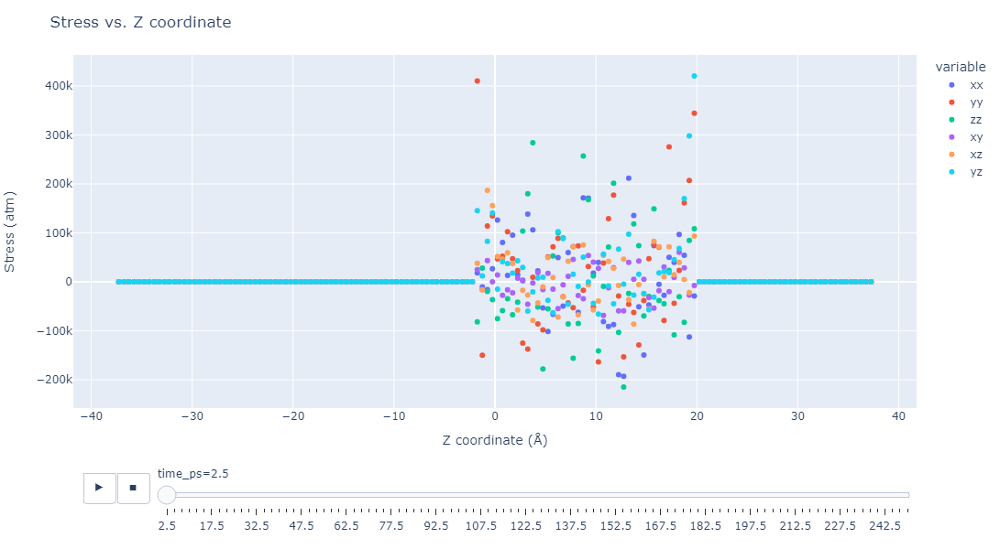

In [8]:
args = read_lmp_fix_file("out.stress.zProfile.txt")
_df = pd.concat(args["dfs"], axis=0)
_df["timestep"] = np.repeat(np.array(args["Timestep"]), args["Number-of-chunks"])
_df["time_ps"] = _df["timestep"] * stepsize
_df.columns = _df.columns[:3].tolist() + ["xx", "yy", "zz", "xy", "xz", "yz"] + _df.columns[9:].tolist()
df = _df.melt(id_vars=['Chunk', 'Coord1', 'Ncount', 'timestep', 'time_ps'], 
              value_vars=["xx", "yy", "zz", "xy", "xz", "yz"])
fig = px.scatter(df, 
                 x="Coord1", y="value", 
                 animation_frame="time_ps", color="variable", 
                 height=600)
fig.update_xaxes(title="Z coordinate (Å)")
fig.update_yaxes(title="Stress (atm)")
fig.update_layout(title="Stress vs. Z coordinate")
fig.show()

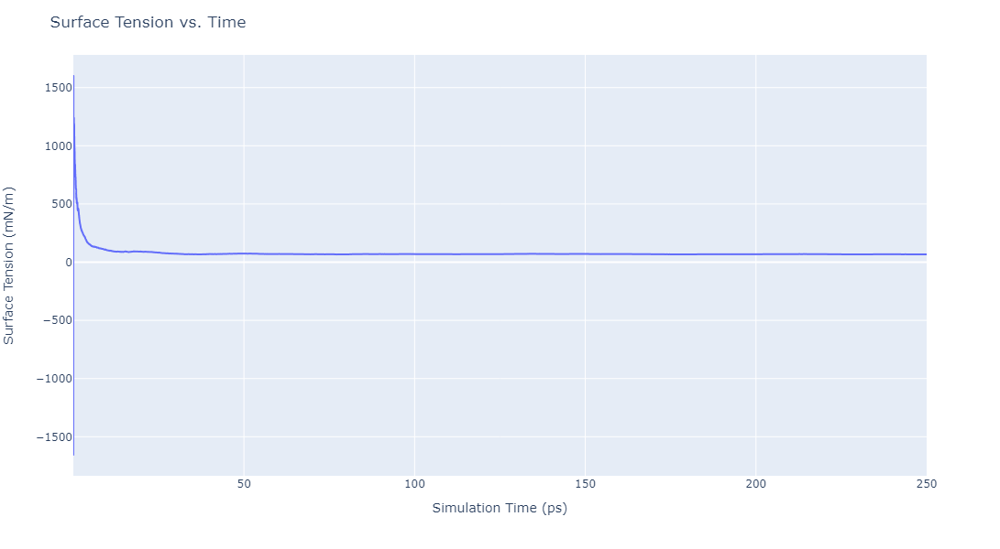

In [9]:
df = pd.read_csv("out.surfTension.running.txt", skiprows=2, sep=r"\s+", names=["Timestep", "Surface Tension (mN/m)"])
df["time_ps"] = df["Timestep"] * stepsize
fig = px.line(df, x="time_ps", y="Surface Tension (mN/m)", height=600)
fig.update_xaxes(title="Simulation Time (ps)")
fig.update_yaxes(title="Surface Tension (mN/m)")
fig.update_layout(title="Surface Tension vs. Time")
fig.show()

In [10]:
str(df.at[len(df)-1, "Surface Tension (mN/m)"]) + " mN/m"

'67.3071 mN/m'